# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 6.6 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=775009520f9bf1496ca8dc1292affa0614e2dd642b844fddaf1fb986269cb281
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/d

In [1]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
torch:  1.12 ; cuda:  cu113
detectron2: 0.6


In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Run a pre-trained detectron2 model

We first download an image from the COCO dataset:

Then, we create a detectron2 config and a detectron2 `DefaultPredictor` to run inference on this image.

In [3]:
cfg = get_cfg()
# add project-specific config (e.g., TensorMask) here if you're not running a model in detectron2's core library
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5  # set threshold for this model
# Find a model from detectron2's model zoo. You can use the https://dl.fbaipublicfiles... url as well
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

# Train on a custom dataset

In this section, we show how to train an existing detectron2 model on a custom dataset in a new format.

We use [catvsdogs dataset](https://github.com/mharunturkmenoglu/detectron2_catsvsdogs)
which only has two classes: cats and dogs.
We'll train a segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

## Prepare the dataset

In [4]:
!wget https://github.com/mharunturkmenoglu/detectron2_catsvsdogs/blob/main/catsvsdogs.zip

--2022-09-06 08:16:27--  https://github.com/mharunturkmenoglu/detectron2_catsvsdogs/blob/main/catsvsdogs.zip
Resolving github.com (github.com)... 192.30.255.112
Connecting to github.com (github.com)|192.30.255.112|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘catsvsdogs.zip.2’

catsvsdogs.zip.2        [ <=>                ] 127.87K  --.-KB/s    in 0.02s   

2022-09-06 08:16:27 (6.39 MB/s) - ‘catsvsdogs.zip.2’ saved [130937]



In [5]:
!unzip catsvsdogs.zip

Archive:  catsvsdogs.zip
replace catsvsdogs/main.py? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: catsvsdogs/main.py      
  inflating: catsvsdogs/train/0.jpg  
  inflating: catsvsdogs/train/0.json  
  inflating: catsvsdogs/train/1.jpg  
  inflating: catsvsdogs/train/1.json  
  inflating: catsvsdogs/train/10.jpg  
  inflating: catsvsdogs/train/10.json  
  inflating: catsvsdogs/train/11.jpg  
  inflating: catsvsdogs/train/11.json  
  inflating: catsvsdogs/train/12.jpg  
  inflating: catsvsdogs/train/12.json  
  inflating: catsvsdogs/train/13.jpg  
  inflating: catsvsdogs/train/13.json  
  inflating: catsvsdogs/train/14.jpg  
  inflating: catsvsdogs/train/14.json  
  inflating: catsvsdogs/train/2.jpg  
  inflating: catsvsdogs/train/2.json  
  inflating: catsvsdogs/train/3.jpg  
  inflating: catsvsdogs/train/3.json  
  inflating: catsvsdogs/train/4.jpg  
  inflating: catsvsdogs/train/4.json  
  inflating: catsvsdogs/train/5.jpg  
  inflating: catsvsdogs/train/5.json  
  inflating:

Register the dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [6]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("train_dataset", {}, "/content/catsvsdogs/train/via_region_data.json", "/content/catsvsdogs/train")
register_coco_instances("val_dataset", {}, "/content/catsvsdogs/validation/via_region_data.json", "/content/catsvsdogs/validation")

To verify the dataset is in correct format, let's visualize the annotations of randomly selected samples in the training set:



## Train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the dataset.


In [7]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("train_dataset",)
cfg.DATASETS.TEST = ("val_dataset",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # only has one class (ballon). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[09/06 08:16:44 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:01, 91.6MB/s]                          
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[09/06 08:16:52 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:478: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2894.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[09/06 08:17:08 d2.utils.events]:  eta: 0:01:50  iter: 19  total_loss: 2.308  loss_cls: 1.215  loss_box_reg: 0.3834  loss_mask: 0.6912  loss_rpn_cls: 0.002156  loss_rpn_loc: 0.01149  time: 0.4018  data_time: 0.0190  lr: 1.6068e-05  max_mem: 2673M
[09/06 08:17:16 d2.utils.events]:  eta: 0:01:41  iter: 39  total_loss: 1.996  loss_cls: 0.8849  loss_box_reg: 0.374  loss_mask: 0.6722  loss_rpn_cls: 0.00245  loss_rpn_loc: 0.01183  time: 0.3976  data_time: 0.0109  lr: 3.2718e-05  max_mem: 2673M
[09/06 08:17:24 d2.utils.events]:  eta: 0:01:34  iter: 59  total_loss: 1.489  loss_cls: 0.4555  loss_box_reg: 0.3701  loss_mask: 0.6334  loss_rpn_cls: 0.002189  loss_rpn_loc: 0.005755  time: 0.4016  data_time: 0.0121  lr: 4.9367e-05  max_mem: 2673M
[09/06 08:17:33 d2.utils.events]:  eta: 0:01:27  iter: 79  total_loss: 1.217  loss_cls: 0.301  loss_box_reg: 0.3464  loss_mask: 0.5698  loss_rpn_cls: 0.001807  loss_rpn_loc: 0.01046  time: 0.4083  data_time: 0.0140  lr: 6.6017e-05  max_mem: 2673M
[09/06 08:1

In [8]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [9]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[09/06 08:19:13 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                                  | Names in Checkpoint                                                                                  | Shapes                                          |
|:------------------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*               | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*               | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*               | backbone.bottom_up.res2.0.conv3.{norm.bia

Then, we randomly select several samples to visualize the prediction results.

WARNING [09/06 08:19:32 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/06 08:19:32 d2.data.datasets.coco]: Loaded 30 images in COCO format from /content/catsvsdogs/validation/via_region_data.json


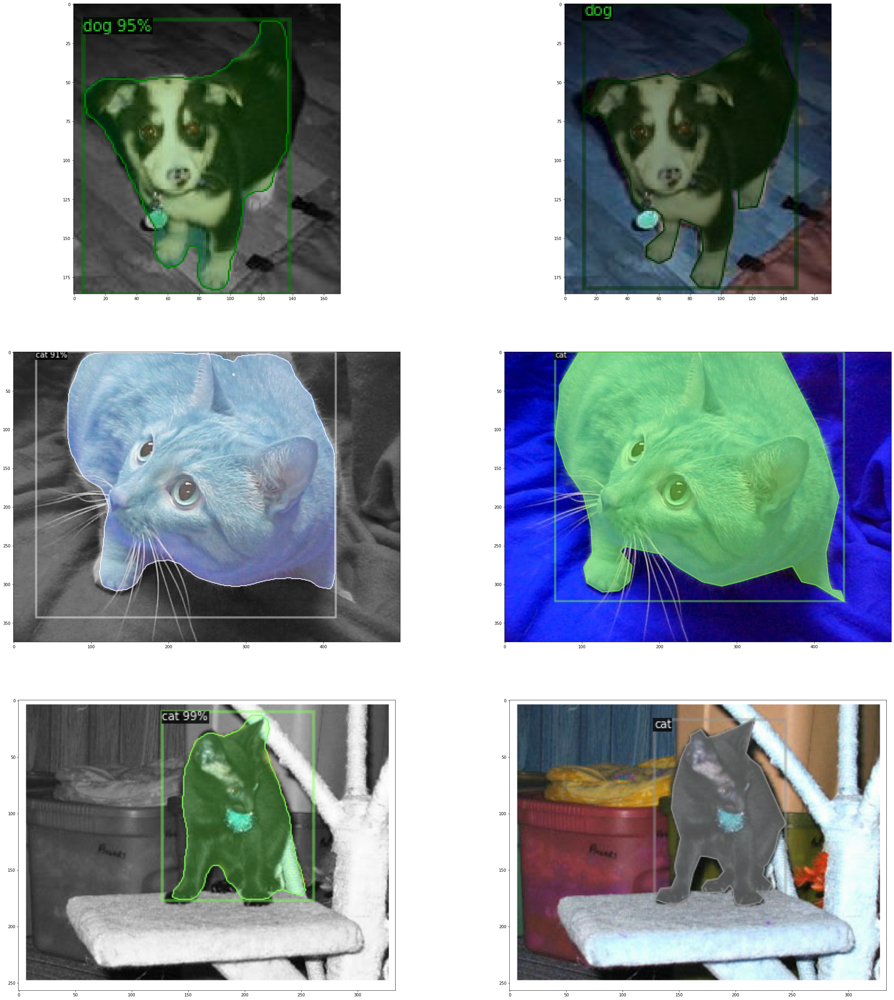

In [12]:
from detectron2.utils.visualizer import ColorMode
import matplotlib.pyplot as plt

dataset_dicts = DatasetCatalog.get('val_dataset')
outs = []
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata = MetadataCatalog.get('train_dataset'), 
                    
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out_pred = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    visualizer = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get('train_dataset'))
    out_target = visualizer.draw_dataset_dict(d)
    outs.append(out_pred)
    outs.append(out_target)
_,axs = plt.subplots(len(outs)//2,2,figsize=(40,45))
for ax, out in zip(axs.reshape(-1), outs):
    ax.imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.

In [11]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val_dataset", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "val_dataset")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

WARNING [09/06 08:19:17 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/06 08:19:17 d2.data.datasets.coco]: Loaded 30 images in COCO format from /content/catsvsdogs/validation/via_region_data.json
[09/06 08:19:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[09/06 08:19:17 d2.data.common]: Serializing 30 elements to byte tensors and concatenating them all ...
[09/06 08:19:17 d2.data.common]: Serialized dataset takes 0.04 MiB
[09/06 08:19:17 d2.evaluation.evaluator]: Start inference on 30 batches
[09/06 08:19:19 d2.evaluation.evaluator]: Inference done 11/30. Dataloading: 0.0013 s/iter. Inference: 0.1084 s/iter. Eval: 0.0012 s/iter. Total: 0.1109 s/iter. ETA=0:00:02
[09/06 08:19:20 d2.evaluation.evaluator]: Total inference time: 0:00:02.610002 (0.104400 s / iter per device, on 1 devices)
[09/06 08:19:2